# 🐾🌊 Animal & Marine Species Identifier
### YOLOv8m-cls — 90 Species · Pre-trained Model
**Model:** YOLOv8m-cls (trained, 90 classes)  
**Framework:** Ultralytics YOLOv8 + PyTorch  
**GPU:** CUDA — works natively on Windows  
**Mode:** Pre-trained weights loaded — no training needed  


## 📦 Step 1: Install Required Libraries

In [ ]:
# Install PyTorch with CUDA first, then ultralytics separately
# (--index-url only applies to the torch packages, not ultralytics)
%pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu121 -q
%pip install ultralytics -q
%pip install opencv-python matplotlib seaborn scikit-learn pillow gradio kaggle tqdm -q
print('✅ All packages installed! Restart kernel if this is first run.')


## 📚 Step 2: Import Libraries & Configure GPU

In [1]:
import os, json, stat, shutil, warnings, time
import base64
from io import BytesIO
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
from PIL import Image
from tqdm import tqdm
from sklearn.metrics import classification_report, confusion_matrix

import torch
from ultralytics import YOLO

# ── CUDA / GPU Setup ──────────────────────────────────────────────────────────
if torch.cuda.is_available():
    device_str = '0'   # YOLOv8 uses '0' for first GPU
    gpu_name   = torch.cuda.get_device_name(0)
    vram       = torch.cuda.get_device_properties(0).total_memory / 1024**3
    print(f'✅ CUDA GPU detected!')
    print(f'   🎮 GPU Name   : {gpu_name}')
    print(f'   💾 VRAM       : {vram:.1f} GB')
    print(f'   🔢 CUDA Ver   : {torch.version.cuda}')
    torch.backends.cudnn.benchmark = True
else:
    device_str = 'cpu'
    print('⚠️  No CUDA GPU — running on CPU')
    print('   pip install torch torchvision --index-url https://download.pytorch.org/whl/cu121')

print(f'\n🖥️  Active device    : {device_str}')
print(f'🔥 PyTorch version  : {torch.__version__}')
print(f'✅ All Libraries Imported!')


✅ CUDA GPU detected!
   🎮 GPU Name   : NVIDIA GeForce MX550
   💾 VRAM       : 2.0 GB
   🔢 CUDA Ver   : 12.1

🖥️  Active device    : 0
🔥 PyTorch version  : 2.5.1+cu121
✅ All Libraries Imported!


## ⚙️ Step 4: Configuration

In [2]:
# ============================================================
# ⚙️ Configuration — Pre-trained YOLOv8m-cls (90 classes)
# ============================================================
DATASET_DIR = r'animals\Diff_animals'
# ── Model file paths ─────────────────────────────────────────────────────────
# Update these paths to wherever you store your trained model files.
# Default below assumes files are in the same folder as this notebook.

WEIGHTS_PATH = 'best.pt'           # ← path to your best.pt
LABELS_PATH  = 'class_labels.json' # ← path to your class_labels.json
HISTORY_PATH     = 'training_history.json'
YOLO_DATASET_DIR = 'yolo_dataset'       # needed for evaluation — skip if not available
MODEL_DIR        = 'saved_model'        # used by storage status cell
CHECKPOINT_DIR   = os.path.join(MODEL_DIR, 'checkpoints')

# ── If you want to keep a saved_model/ folder structure instead ──────────────
# MODEL_DIR    = 'saved_model'
# WEIGHTS_PATH = os.path.join(MODEL_DIR, 'best.pt')
# LABELS_PATH  = os.path.join(MODEL_DIR, 'class_labels.json')

# ── Model variant (only used if retraining from scratch) ─────────────────────
#
#   yolov8n-cls  4 MB   Fastest  ★★☆☆☆  ~300 MB VRAM
#   yolov8s-cls  6 MB   Fast     ★★★☆☆  ~400 MB VRAM
#   yolov8m-cls  17 MB  Medium   ★★★★☆  ~800 MB VRAM  ← current
#   yolov8l-cls  37 MB  Slow     ★★★★☆  ~1.5 GB VRAM
#   yolov8x-cls  57 MB  Slowest  ★★★★★  ~1.8 GB VRAM
#
YOLO_MODEL = 'yolov8m-cls.pt'

# ── Hyperparameters (only used if retraining) ─────────────────────────────────
IMG_SIZE     = 224
BATCH_SIZE   = 16
EPOCHS       = 50
LR           = 1e-3
RANDOM_STATE = 42

# ── Load class labels ─────────────────────────────────────────────────────────
with open(LABELS_PATH, 'r') as f:
    raw = json.load(f)
idx_to_class = {int(k): v for k, v in raw.items()}
class_names  = [idx_to_class[i] for i in sorted(idx_to_class)]
NUM_CLASSES  = len(class_names)

print(f'✅ Configuration Set!')
print(f'   Weights        : {WEIGHTS_PATH}')
print(f'   Model variant  : {YOLO_MODEL}')
print(f'   Image Size     : {IMG_SIZE}')
print(f'   Total Classes  : {NUM_CLASSES}')
print(f'   Classes        : {class_names}')


✅ Configuration Set!
   Weights        : best.pt
   Model variant  : yolov8m-cls.pt
   Image Size     : 224
   Total Classes  : 90
   Classes        : ['antelope', 'badger', 'bat', 'bear', 'bee', 'beetle', 'bison', 'boar', 'butterfly', 'cat', 'caterpillar', 'chimpanzee', 'cockroach', 'cow', 'coyote', 'crab', 'crow', 'deer', 'dog', 'dolphin', 'donkey', 'dragonfly', 'duck', 'eagle', 'elephant', 'flamingo', 'fly', 'fox', 'goat', 'goldfish', 'goose', 'gorilla', 'grasshopper', 'hamster', 'hare', 'hedgehog', 'hippopotamus', 'hornbill', 'horse', 'hummingbird', 'hyena', 'jellyfish', 'kangaroo', 'koala', 'ladybugs', 'leopard', 'lion', 'lizard', 'lobster', 'mosquito', 'moth', 'mouse', 'octopus', 'okapi', 'orangutan', 'otter', 'owl', 'ox', 'oyster', 'panda', 'parrot', 'pelecaniformes', 'penguin', 'pig', 'pigeon', 'porcupine', 'possum', 'raccoon', 'rat', 'reindeer', 'rhinoceros', 'sandpiper', 'seahorse', 'seal', 'shark', 'sheep', 'snake', 'sparrow', 'squid', 'squirrel', 'starfish', 'swan', 'tiger'

## 🔍 Step 5: Exploratory Data Analysis (EDA)

Total Images : 5400
                Count
antelope           60
badger             60
bat                60
bear               60
bee                60
beetle             60
bison              60
boar               60
butterfly          60
cat                60
caterpillar        60
chimpanzee         60
cockroach          60
cow                60
coyote             60
crab               60
crow               60
deer               60
dog                60
dolphin            60
donkey             60
dragonfly          60
duck               60
eagle              60
elephant           60
flamingo           60
fly                60
fox                60
goat               60
goldfish           60
goose              60
gorilla            60
grasshopper        60
hamster            60
hare               60
hedgehog           60
hippopotamus       60
hornbill           60
horse              60
hummingbird        60
hyena              60
jellyfish          60
kangaroo           60
koala       

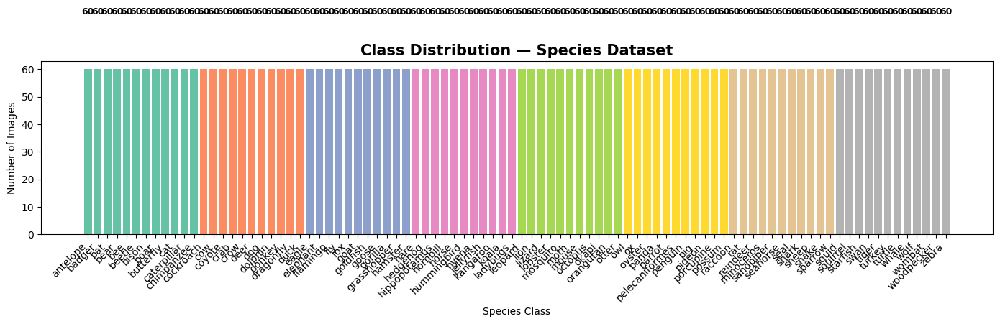

In [3]:
class_counts = {}
for cls in class_names:
    cls_path = os.path.join(DATASET_DIR, cls)
    imgs = [f for f in os.listdir(cls_path)
            if f.lower().endswith(('.jpg','.jpeg','.png'))]
    class_counts[cls] = len(imgs)

total = sum(class_counts.values())
print(f'Total Images : {total}')
print(pd.DataFrame.from_dict(class_counts, orient='index', columns=['Count']).to_string())

plt.figure(figsize=(14, 5))
colors = plt.cm.Set2(np.linspace(0, 1, NUM_CLASSES))
bars = plt.bar(class_counts.keys(), class_counts.values(), color=colors)
for bar, val in zip(bars, class_counts.values()):
    plt.text(bar.get_x() + bar.get_width()/2,
             bar.get_height() + 20, str(val), ha='center', fontsize=9, fontweight='bold')
plt.title('Class Distribution — Species Dataset', fontsize=15, fontweight='bold')
plt.xlabel('Species Class'); plt.ylabel('Number of Images')
plt.xticks(rotation=45, ha='right'); plt.tight_layout()
plt.savefig('class_distribution.png', dpi=150); plt.show()


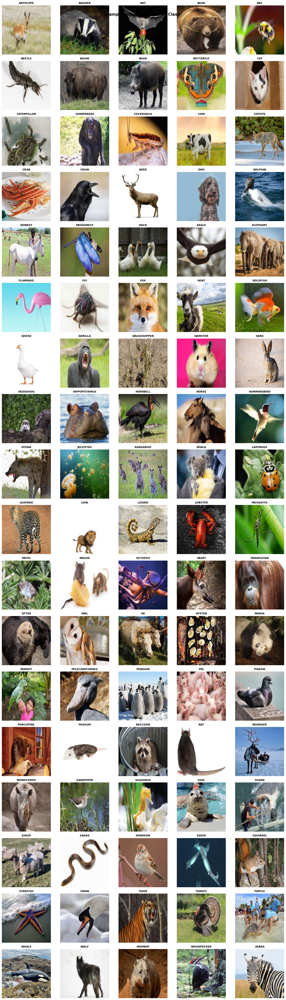

In [4]:
cols = min(5, NUM_CLASSES)
rows = (NUM_CLASSES + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(16, rows * 3))
axes = axes.flatten()
for idx, cls in enumerate(class_names):
    cls_path = os.path.join(DATASET_DIR, cls)
    imgs = [f for f in os.listdir(cls_path) if f.lower().endswith(('.jpg','.jpeg','.png'))]
    if imgs:
        img = Image.open(os.path.join(cls_path, imgs[0])).resize((150,150))
        axes[idx].imshow(img); axes[idx].set_title(cls.upper(), fontsize=10, fontweight='bold')
        axes[idx].axis('off')
for i in range(idx+1, len(axes)): axes[i].axis('off')
plt.suptitle('Sample Images per Species Class', fontsize=15, fontweight='bold')
plt.tight_layout(); plt.savefig('sample_images.png', dpi=150); plt.show()


## 🗂️ Step 6: Build YOLOv8 Dataset Structure

In [5]:
# Dataset structure builder — only needed if you want to re-evaluate on val split.
# SKIP this cell if you only want to run the Gradio dashboard.
import random, shutil
random.seed(RANDOM_STATE)

def build_yolo_dataset(src_dir, dst_dir, val_split=0.2):
    if os.path.exists(dst_dir):
        print(f'  ⏭️  YOLO dataset already exists at {dst_dir}')
        return
    if not os.path.exists(src_dir):
        print(f'  ⚠️  DATASET_DIR not found: {src_dir}')
        print(f'  ℹ️  Skipping dataset build — jump to Step 11 to run the dashboard.')
        return
    print('  Building YOLO dataset structure...')
    for split in ['train', 'val']:
        for cls in class_names:
            os.makedirs(os.path.join(dst_dir, split, cls), exist_ok=True)
    for cls in class_names:
        cls_src = os.path.join(src_dir, cls)
        if not os.path.exists(cls_src): continue
        all_imgs = [f for f in os.listdir(cls_src)
                    if f.lower().endswith(('.jpg','.jpeg','.png'))]
        random.shuffle(all_imgs)
        val_n      = int(len(all_imgs) * val_split)
        val_imgs   = all_imgs[:val_n]
        train_imgs = all_imgs[val_n:]
        for fname in train_imgs:
            shutil.copy2(os.path.join(cls_src, fname),
                         os.path.join(dst_dir, 'train', cls, fname))
        for fname in val_imgs:
            shutil.copy2(os.path.join(cls_src, fname),
                         os.path.join(dst_dir, 'val', cls, fname))
        print(f'    {cls:<14}: {len(train_imgs)} train, {len(val_imgs)} val')
    print(f'  ✅ YOLO dataset ready at: {dst_dir}')

build_yolo_dataset(DATASET_DIR, YOLO_DATASET_DIR)


  Building YOLO dataset structure...
    antelope      : 48 train, 12 val
    badger        : 48 train, 12 val
    bat           : 48 train, 12 val
    bear          : 48 train, 12 val
    bee           : 48 train, 12 val
    beetle        : 48 train, 12 val
    bison         : 48 train, 12 val
    boar          : 48 train, 12 val
    butterfly     : 48 train, 12 val
    cat           : 48 train, 12 val
    caterpillar   : 48 train, 12 val
    chimpanzee    : 48 train, 12 val
    cockroach     : 48 train, 12 val
    cow           : 48 train, 12 val
    coyote        : 48 train, 12 val
    crab          : 48 train, 12 val
    crow          : 48 train, 12 val
    deer          : 48 train, 12 val
    dog           : 48 train, 12 val
    dolphin       : 48 train, 12 val
    donkey        : 48 train, 12 val
    dragonfly     : 48 train, 12 val
    duck          : 48 train, 12 val
    eagle         : 48 train, 12 val
    elephant      : 48 train, 12 val
    flamingo      : 48 train, 12 val
 

## 🚀 Step 7: Load Pre-trained Model


In [6]:
# ============================================================
# 🚀 Load Pre-trained Model — No Training Required
# ============================================================
# Loads best.pt directly. If you want to retrain from scratch,
# replace best.pt with 'yolov8m-cls.pt' (base pretrained weights)
# and re-run with model.train(...)

from ultralytics import YOLO

assert os.path.exists(WEIGHTS_PATH), (
    f'❌ Weights not found at: {WEIGHTS_PATH}\n'
    f'   Make sure best.pt is in the same folder as this notebook.'
)

model = YOLO(WEIGHTS_PATH)
model.overrides['verbose'] = False

# Load training history if available
history = None
if os.path.exists(HISTORY_PATH):
    with open(HISTORY_PATH, 'r') as f:
        history = json.load(f)

print('=' * 55)
print('  ✅ Model loaded successfully!')
print('=' * 55)
print(f'  📂 Weights    : {os.path.abspath(WEIGHTS_PATH)}')
print(f'  🎯 Classes    : {NUM_CLASSES}')
print(f'  🖥️  Device     : {device_str}')
if history:
    top1 = history.get("val_acc", [None])[-1]
    top5 = history.get("top5_acc", [None])[-1]
    if top1: print(f'  🏆 Top-1 Acc  : {top1*100:.2f}%  (from training history)')
    if top5: print(f'  🥇 Top-5 Acc  : {top5*100:.2f}%  (from training history)')
print('  🚀 Ready for inference!')


  ✅ Model loaded successfully!
  📂 Weights    : d:\SIC_pro_Yolo_model\best.pt
  🎯 Classes    : 90
  🖥️  Device     : 0
  🏆 Top-1 Acc  : 93.52%  (from training history)
  🥇 Top-5 Acc  : 98.89%  (from training history)
  🚀 Ready for inference!


## 📈 Step 8: Evaluate Model

In [7]:
# Evaluation requires the YOLO dataset structure.
# Skip this cell if you only have best.pt and class_labels.json.
if not os.path.exists(YOLO_DATASET_DIR):
    print('⚠️  yolo_dataset/ not found — skipping validation.')
    print('   Jump to Step 11 to launch the Gradio dashboard directly.')
else:
    print('Running YOLOv8 validation...')
    val_results = model.val(
        data   = YOLO_DATASET_DIR,
        imgsz  = IMG_SIZE,
        batch  = BATCH_SIZE,
        device = device_str,
        verbose= True,
    )
    top1 = val_results.top1
    top5 = val_results.top5
    print(f'\n✅ Validation Results:')
    print(f'   Top-1 Accuracy : {top1*100:.2f}%')
    print(f'   Top-5 Accuracy : {top5*100:.2f}%')


Running YOLOv8 validation...
Ultralytics 8.4.41  Python-3.11.9 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce MX550, 2048MiB)
YOLOv8m-cls summary (fused): 42 layers, 15,877,946 parameters, 0 gradients, 41.7 GFLOPs
train: D:\SIC_pro_Yolo_model\yolo_dataset\train... found 4320 images in 90 classes  
val: D:\SIC_pro_Yolo_model\yolo_dataset\val... found 1080 images in 90 classes  
test: None...
val: Fast image access  (ping: 0.10.1 ms, read: 8.79.8 MB/s, size: 67.3 KB)
val: Scanning D:\SIC_pro_Yolo_model\yolo_dataset\val... 1080 images, 0 corrupt: 100% ━━━━━━━━━━━━ 1080/1080 696.3it/s 1.6s0.0s
val: New cache created: D:\SIC_pro_Yolo_model\yolo_dataset\val.cache
               classes   top1_acc   top5_acc: 100% ━━━━━━━━━━━━ 68/68 3.7it/s 18.5s0.2s
                   all      0.985      0.998
Speed: 0.1ms preprocess, 16.8ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to D:\SIC_pro_Yolo_model\runs\classify\val

✅ Validation Results:
   Top-1 Accuracy : 98.52%
   Top-5 Accuracy


Classification Report:
                precision    recall  f1-score   support

      antelope       0.92      1.00      0.96        12
        badger       1.00      1.00      1.00        12
           bat       1.00      1.00      1.00        12
          bear       1.00      1.00      1.00        12
           bee       1.00      1.00      1.00        12
        beetle       1.00      1.00      1.00        12
         bison       1.00      1.00      1.00        12
          boar       1.00      0.92      0.96        12
     butterfly       1.00      1.00      1.00        12
           cat       1.00      1.00      1.00        12
   caterpillar       1.00      1.00      1.00        12
    chimpanzee       1.00      1.00      1.00        12
     cockroach       1.00      1.00      1.00        12
           cow       1.00      0.92      0.96        12
        coyote       1.00      0.92      0.96        12
          crab       0.92      1.00      0.96        12
          crow       1.

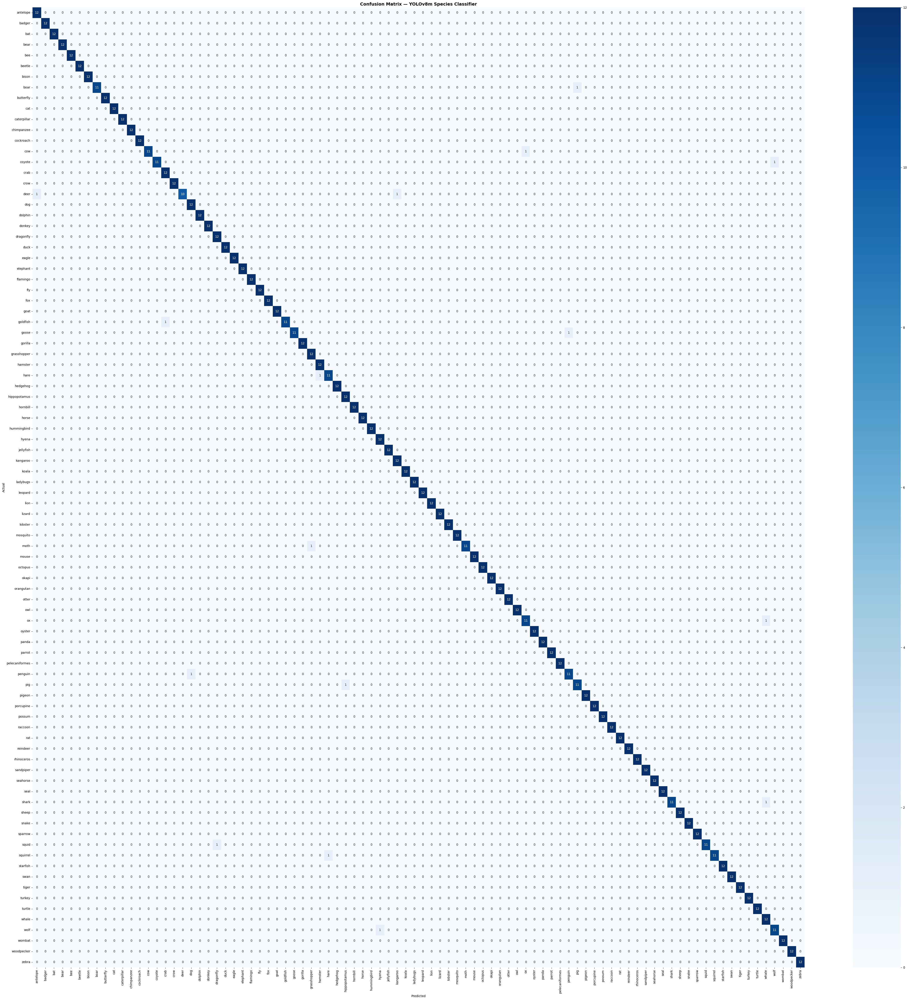

In [8]:
# Confusion matrix — requires yolo_dataset/ folder.
# Skip if not available.
val_dir = os.path.join(YOLO_DATASET_DIR, 'val')
if not os.path.exists(val_dir):
    print('⚠️  val/ split not found — skipping confusion matrix.')
else:
    all_preds, all_labels = [], []
    for cls_idx, cls_name in enumerate(class_names):
        cls_dir   = os.path.join(val_dir, cls_name)
        if not os.path.exists(cls_dir): continue
        img_files = [f for f in os.listdir(cls_dir)
                     if f.lower().endswith(('.jpg','.jpeg','.png'))]
        for fname in tqdm(img_files, desc=f'  {cls_name}', leave=False):
            result   = model(os.path.join(cls_dir, fname), verbose=False)[0]
            pred_idx = int(result.probs.top1)
            all_preds.append(pred_idx)
            all_labels.append(cls_idx)
    print('\nClassification Report:')
    print('=' * 60)
    print(classification_report(all_labels, all_preds, target_names=class_names))
    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(max(14,NUM_CLASSES//2), max(12,NUM_CLASSES//2)))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title('Confusion Matrix — YOLOv8m Species Classifier', fontsize=14, fontweight='bold')
    plt.ylabel('Actual'); plt.xlabel('Predicted')
    plt.xticks(rotation=90); plt.tight_layout()
    plt.savefig('confusion_matrix.png', dpi=150); plt.show()


## 🔍 Step 9: Predict on Single Image

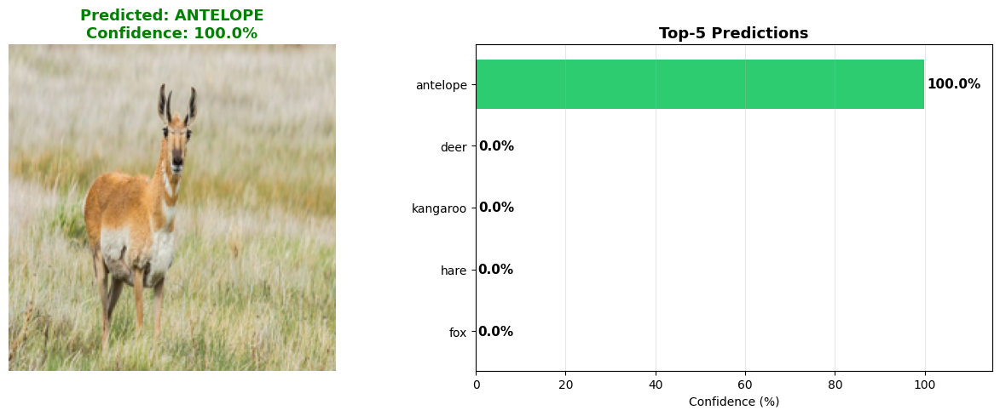

  1. antelope             → 99.96%
  2. deer                 → 0.01%
  3. kangaroo             → 0.01%
  4. hare                 → 0.00%
  5. fox                  → 0.00%


In [9]:
def predict_species_file(img_path, top_k=5):
    result  = model(img_path, verbose=False)[0]
    probs   = result.probs.data.cpu().numpy()
    top_idx = probs.argsort()[::-1][:top_k]
    names   = result.names  # YOLOv8 stores class names in result
    top_preds = [(names[i], float(probs[i])*100) for i in top_idx]

    fig, axes = plt.subplots(1, 2, figsize=(13, 5))
    img = Image.open(img_path).convert('RGB')
    axes[0].imshow(img.resize((224,224)))
    axes[0].set_title(
        f'Predicted: {top_preds[0][0].upper()}\nConfidence: {top_preds[0][1]:.1f}%',
        fontsize=13, fontweight='bold', color='green')
    axes[0].axis('off')

    species = [p[0] for p in top_preds]
    confs   = [p[1] for p in top_preds]
    clrs    = ['#2ecc71' if i==0 else '#3498db' for i in range(len(top_preds))]
    axes[1].barh(species[::-1], confs[::-1], color=clrs[::-1])
    for i,(c,s) in enumerate(zip(confs[::-1], species[::-1])):
        axes[1].text(c+0.5, i, f'{c:.1f}%', va='center', fontsize=11, fontweight='bold')
    axes[1].set_title(f'Top-{top_k} Predictions', fontsize=13, fontweight='bold')
    axes[1].set_xlabel('Confidence (%)'); axes[1].set_xlim(0,115)
    axes[1].grid(axis='x', alpha=0.3)
    plt.tight_layout(); plt.savefig('prediction_result.png', dpi=150); plt.show()
    return top_preds

# Test on sample
sample_cls  = class_names[0]
sample_dir  = os.path.join(DATASET_DIR, sample_cls)
sample_imgs = [f for f in os.listdir(sample_dir) if f.lower().endswith(('.jpg','.jpeg','.png'))]
if sample_imgs:
    results = predict_species_file(os.path.join(sample_dir, sample_imgs[0]))
    for rank,(sp,conf) in enumerate(results, 1):
        print(f'  {rank}. {sp:<20} → {conf:.2f}%')


## 💾 Step 10: Model Storage Status

In [11]:
print('=' * 60)
print('  MODEL STORAGE STATUS')
print('=' * 60)
files = {
    'Best Weights  (required)' : WEIGHTS_PATH,
    'Class Labels  (required)' : LABELS_PATH,
    'Training History         ': HISTORY_PATH,
    'Checkpoints Dir          ': CHECKPOINT_DIR,
}
for label, path in files.items():
    if os.path.exists(path):
        sz = os.path.getsize(path)/1024 if os.path.isfile(path) else sum(
            os.path.getsize(os.path.join(path,f))/1024
            for f in os.listdir(path) if os.path.isfile(os.path.join(path,f)))
        sz_str = f'{sz/1024:.1f} MB' if sz>1024 else f'{sz:.1f} KB'
        print(f'  ✅ {label:<30} {sz_str:<10} {path}')
    else:
        print(f'  ❌ {label:<30} NOT FOUND    {path}')
print('=' * 60)
print('  💡 TIPS:')
print('  • Next run loads instantly — training is skipped')
print('  • If training was interrupted, checkpoints auto-resume it')
print(f'  • To retrain from scratch: delete {MODEL_DIR}/ and re-run')
#print(f'  • Checkpoints dir: {os.path.abspath(CHECKPOINT_DIR)}')
#ckpts = [f for f in os.listdir(CHECKPOINT_DIR) if f.endswith('.pt')]
#print(f'  • Epoch checkpoints saved: {len(ckpts)} → {ckpts}')


  MODEL STORAGE STATUS
  ✅ Best Weights  (required)       30.4 MB    best.pt
  ✅ Class Labels  (required)       1.6 KB     class_labels.json
  ✅ Training History               0.1 KB     training_history.json
  ❌ Checkpoints Dir                NOT FOUND    saved_model\checkpoints
  💡 TIPS:
  • Next run loads instantly — training is skipped
  • If training was interrupted, checkpoints auto-resume it
  • To retrain from scratch: delete saved_model/ and re-run


## 🌐 Step 11: Gradio Dashboard

In [12]:
# ── Ensure model is in memory before launching app ──────────────────────────
if 'model' not in dir() or model is None:
    print('🔄 Model not in memory — loading from disk...')
    assert os.path.exists(WEIGHTS_PATH), f'❌ Weights not found: {WEIGHTS_PATH}'
    model = YOLO(WEIGHTS_PATH)
    model.overrides['verbose'] = False
    with open(LABELS_PATH, 'r') as f:
        raw = json.load(f)
    idx_to_class = {int(k): v for k, v in raw.items()}
    class_names  = [idx_to_class[i] for i in sorted(idx_to_class)]
    NUM_CLASSES  = len(class_names)
    print('✅ Model loaded from disk!')
else:
    print('✅ Model already in memory — launching app directly.')

import gradio as gr
from PIL import Image
import numpy as np
import base64
from io import BytesIO

SPECIES_INFO = {
    'antelope'      :{'habitat':'Africa/Asia',      'type':'Mammal',   'status':'Varies',        'emoji':'🦌'},
    'badger'        :{'habitat':'Woodlands',        'type':'Mammal',   'status':'Least Concern', 'emoji':'🦡'},
    'bat'           :{'habitat':'Worldwide',        'type':'Mammal',   'status':'Varies',        'emoji':'🦇'},
    'bear'          :{'habitat':'Forests',          'type':'Mammal',   'status':'Vulnerable',    'emoji':'🐻'},
    'bee'           :{'habitat':'Worldwide',        'type':'Insect',   'status':'Vulnerable',    'emoji':'🐝'},
    'beetle'        :{'habitat':'Worldwide',        'type':'Insect',   'status':'Least Concern', 'emoji':'🪲'},
    'bison'         :{'habitat':'Grasslands',       'type':'Mammal',   'status':'Near Threatened','emoji':'🦬'},
    'boar'          :{'habitat':'Forests',          'type':'Mammal',   'status':'Least Concern', 'emoji':'🐗'},
    'butterfly'     :{'habitat':'Gardens/Meadows',  'type':'Insect',   'status':'Varies',        'emoji':'🦋'},
    'cat'           :{'habitat':'Domestic',         'type':'Mammal',   'status':'Domesticated',  'emoji':'🐈'},
    'caterpillar'   :{'habitat':'Worldwide',        'type':'Insect',   'status':'Least Concern', 'emoji':'🐛'},
    'chimpanzee'    :{'habitat':'Africa',           'type':'Primate',  'status':'Endangered',    'emoji':'🐒'},
    'cockroach'     :{'habitat':'Worldwide',        'type':'Insect',   'status':'Least Concern', 'emoji':'🪳'},
    'cow'           :{'habitat':'Farms',            'type':'Mammal',   'status':'Domesticated',  'emoji':'🐄'},
    'coyote'        :{'habitat':'N. America',       'type':'Mammal',   'status':'Least Concern', 'emoji':'🐺'},
    'crab'          :{'habitat':'Oceans',           'type':'Crustacean','status':'Least Concern','emoji':'🦀'},
    'crow'          :{'habitat':'Worldwide',        'type':'Bird',     'status':'Least Concern', 'emoji':'🐦‍⬛'},
    'deer'          :{'habitat':'Forests',          'type':'Mammal',   'status':'Least Concern', 'emoji':'🦌'},
    'dog'           :{'habitat':'Domestic',         'type':'Mammal',   'status':'Domesticated',  'emoji':'🐕'},
    'dolphin'       :{'habitat':'Oceans',           'type':'Mammal',   'status':'Least Concern', 'emoji':'🐬'},
    'donkey'        :{'habitat':'Domestic',         'type':'Mammal',   'status':'Domesticated',  'emoji':'🫏'},
    'dragonfly'     :{'habitat':'Wetlands',         'type':'Insect',   'status':'Least Concern', 'emoji':'🪻'},
    'duck'          :{'habitat':'Wetlands',         'type':'Bird',     'status':'Least Concern', 'emoji':'🦆'},
    'eagle'         :{'habitat':'Mountains',        'type':'Bird',     'status':'Least Concern', 'emoji':'🦅'},
    'elephant'      :{'habitat':'Africa, Asia',     'type':'Mammal',   'status':'Vulnerable',    'emoji':'🐘'},
    'flamingo'      :{'habitat':'Wetlands',         'type':'Bird',     'status':'Least Concern', 'emoji':'🦩'},
    'fly'           :{'habitat':'Worldwide',        'type':'Insect',   'status':'Least Concern', 'emoji':'🪰'},
    'fox'           :{'habitat':'Forests',          'type':'Mammal',   'status':'Least Concern', 'emoji':'🦊'},
    'goat'          :{'habitat':'Mountains',        'type':'Mammal',   'status':'Domesticated',  'emoji':'🐐'},
    'goldfish'      :{'habitat':'Freshwater',       'type':'Fish',     'status':'Least Concern', 'emoji':'🐟'},
    'goose'         :{'habitat':'Wetlands',         'type':'Bird',     'status':'Least Concern', 'emoji':'🪿'},
    'gorilla'       :{'habitat':'Africa',           'type':'Primate',  'status':'Endangered',    'emoji':'🦍'},
    'grasshopper'   :{'habitat':'Grasslands',       'type':'Insect',   'status':'Least Concern', 'emoji':'🦗'},
    'hamster'       :{'habitat':'Domestic',         'type':'Mammal',   'status':'Domesticated',  'emoji':'🐹'},
    'hare'          :{'habitat':'Grasslands',       'type':'Mammal',   'status':'Least Concern', 'emoji':'🐇'},
    'hedgehog'      :{'habitat':'Gardens',          'type':'Mammal',   'status':'Least Concern', 'emoji':'🦔'},
    'hippopotamus'  :{'habitat':'Africa',           'type':'Mammal',   'status':'Vulnerable',    'emoji':'🦛'},
    'hornbill'      :{'habitat':'Tropical Forests', 'type':'Bird',     'status':'Varies',        'emoji':'🐦'},
    'horse'         :{'habitat':'Grasslands',       'type':'Mammal',   'status':'Domesticated',  'emoji':'🐴'},
    'hummingbird'   :{'habitat':'Americas',         'type':'Bird',     'status':'Least Concern', 'emoji':'🐦'},
    'hyena'         :{'habitat':'Africa',           'type':'Mammal',   'status':'Least Concern', 'emoji':'🐾'},
    'jellyfish'     :{'habitat':'Oceans',           'type':'Marine',   'status':'Least Concern', 'emoji':'🪼'},
    'kangaroo'      :{'habitat':'Australia',        'type':'Mammal',   'status':'Least Concern', 'emoji':'🦘'},
    'koala'         :{'habitat':'Australia',        'type':'Mammal',   'status':'Vulnerable',    'emoji':'🐨'},
    'ladybugs'      :{'habitat':'Worldwide',        'type':'Insect',   'status':'Least Concern', 'emoji':'🐞'},
    'leopard'       :{'habitat':'Africa/Asia',      'type':'Mammal',   'status':'Vulnerable',    'emoji':'🐆'},
    'lion'          :{'habitat':'Africa',           'type':'Mammal',   'status':'Vulnerable',    'emoji':'🦁'},
    'lizard'        :{'habitat':'Worldwide',        'type':'Reptile',  'status':'Varies',        'emoji':'🦎'},
    'lobster'       :{'habitat':'Oceans',           'type':'Crustacean','status':'Least Concern','emoji':'🦞'},
    'mosquito'      :{'habitat':'Worldwide',        'type':'Insect',   'status':'Least Concern', 'emoji':'🦟'},
    'moth'          :{'habitat':'Worldwide',        'type':'Insect',   'status':'Varies',        'emoji':'🦋'},
    'mouse'         :{'habitat':'Worldwide',        'type':'Mammal',   'status':'Least Concern', 'emoji':'🐭'},
    'octopus'       :{'habitat':'Oceans',           'type':'Marine',   'status':'Least Concern', 'emoji':'🐙'},
    'okapi'         :{'habitat':'Africa',           'type':'Mammal',   'status':'Endangered',    'emoji':'🦒'},
    'orangutan'     :{'habitat':'SE Asia',          'type':'Primate',  'status':'Critically End.','emoji':'🦧'},
    'otter'         :{'habitat':'Rivers/Coasts',    'type':'Mammal',   'status':'Varies',        'emoji':'🦦'},
    'owl'           :{'habitat':'Forests',          'type':'Bird',     'status':'Least Concern', 'emoji':'🦉'},
    'ox'            :{'habitat':'Farms',            'type':'Mammal',   'status':'Domesticated',  'emoji':'🐂'},
    'oyster'        :{'habitat':'Oceans',           'type':'Mollusk',  'status':'Least Concern', 'emoji':'🦪'},
    'panda'         :{'habitat':'China',            'type':'Mammal',   'status':'Vulnerable',    'emoji':'🐼'},
    'parrot'        :{'habitat':'Tropics',          'type':'Bird',     'status':'Varies',        'emoji':'🦜'},
    'pelecaniformes':{'habitat':'Coasts',           'type':'Bird',     'status':'Varies',        'emoji':'🐦'},
    'penguin'       :{'habitat':'Antarctic',        'type':'Bird',     'status':'Varies',        'emoji':'🐧'},
    'pig'           :{'habitat':'Farms',            'type':'Mammal',   'status':'Domesticated',  'emoji':'🐷'},
    'pigeon'        :{'habitat':'Urban',            'type':'Bird',     'status':'Least Concern', 'emoji':'🕊️'},
    'porcupine'     :{'habitat':'Forests',          'type':'Mammal',   'status':'Least Concern', 'emoji':'🦔'},
    'possum'        :{'habitat':'Australia/Americas','type':'Mammal',  'status':'Least Concern', 'emoji':'🐾'},
    'raccoon'       :{'habitat':'N. America',       'type':'Mammal',   'status':'Least Concern', 'emoji':'🦝'},
    'rat'           :{'habitat':'Worldwide',        'type':'Mammal',   'status':'Least Concern', 'emoji':'🐀'},
    'reindeer'      :{'habitat':'Arctic',           'type':'Mammal',   'status':'Vulnerable',    'emoji':'🦌'},
    'rhinoceros'    :{'habitat':'Africa/Asia',      'type':'Mammal',   'status':'Vulnerable',    'emoji':'🦏'},
    'sandpiper'     :{'habitat':'Shores',           'type':'Bird',     'status':'Least Concern', 'emoji':'🐦'},
    'seahorse'      :{'habitat':'Oceans',           'type':'Fish',     'status':'Vulnerable',    'emoji':'🐴'},
    'seal'          :{'habitat':'Coasts',           'type':'Mammal',   'status':'Varies',        'emoji':'🦭'},
    'shark'         :{'habitat':'Oceans',           'type':'Fish',     'status':'Varies',        'emoji':'🦈'},
    'sheep'         :{'habitat':'Grasslands',       'type':'Mammal',   'status':'Domesticated',  'emoji':'🐑'},
    'snake'         :{'habitat':'Worldwide',        'type':'Reptile',  'status':'Varies',        'emoji':'🐍'},
    'sparrow'       :{'habitat':'Worldwide',        'type':'Bird',     'status':'Least Concern', 'emoji':'🐦'},
    'squid'         :{'habitat':'Oceans',           'type':'Marine',   'status':'Least Concern', 'emoji':'🦑'},
    'squirrel'      :{'habitat':'Forests',          'type':'Mammal',   'status':'Least Concern', 'emoji':'🐿️'},
    'starfish'      :{'habitat':'Oceans',           'type':'Marine',   'status':'Least Concern', 'emoji':'⭐'},
    'swan'          :{'habitat':'Lakes',            'type':'Bird',     'status':'Least Concern', 'emoji':'🦢'},
    'tiger'         :{'habitat':'Asia',             'type':'Mammal',   'status':'Endangered',    'emoji':'🐯'},
    'turkey'        :{'habitat':'N. America',       'type':'Bird',     'status':'Least Concern', 'emoji':'🦃'},
    'turtle'        :{'habitat':'Oceans/Land',      'type':'Reptile',  'status':'Vulnerable',    'emoji':'🐢'},
    'whale'         :{'habitat':'Oceans',           'type':'Mammal',   'status':'Varies',        'emoji':'🐋'},
    'wolf'          :{'habitat':'Forests',          'type':'Mammal',   'status':'Least Concern', 'emoji':'🐺'},
    'wombat'        :{'habitat':'Australia',        'type':'Mammal',   'status':'Least Concern', 'emoji':'🐾'},
    'woodpecker'    :{'habitat':'Forests',          'type':'Bird',     'status':'Least Concern', 'emoji':'🐦'},
    'zebra'         :{'habitat':'Africa',           'type':'Mammal',   'status':'Near Threatened','emoji':'🦓'},
}

def predict_single(image):
    if image is None:
        return None, "<div style='text-align:center;padding:40px;color:#888;font-family:serif;font-size:1.1rem'>Upload an image to see results</div>"
    try:
        pil_img = Image.fromarray(image.astype('uint8')).convert('RGB')
        result  = model(pil_img, verbose=False)[0]
        probs   = result.probs.data.cpu().numpy()
        names   = result.names
        top5_idx  = probs.argsort()[::-1][:5]
        top_name  = names[top5_idx[0]]
        top_conf  = probs[top5_idx[0]] * 100
        info = SPECIES_INFO.get(top_name.lower(), {'habitat':'Unknown','type':'Unknown','status':'Unknown','emoji':'🐾'})
        colors = ['#22c55e','#3b82f6','#8b5cf6','#f59e0b','#ef4444']
        bars_html = ''
        for rank, idx in enumerate(top5_idx):
            n = names[idx]; c = probs[idx]*100
            sp_info = SPECIES_INFO.get(n.lower(), {'emoji':'🐾'})
            bars_html += f'''
            <div style="margin-bottom:14px;">
              <div style="display:flex;justify-content:space-between;align-items:center;margin-bottom:5px;">
                <span style="font-family:'Playfair Display',serif;font-size:0.95rem;color:#1a1a2e;font-weight:600;">{sp_info["emoji"]} {n.upper()}</span>
                <span style="font-family:'DM Mono',monospace;font-size:0.9rem;color:{colors[rank]};font-weight:700;">{c:.1f}%</span>
              </div>
              <div style="background:#f0f0f5;border-radius:999px;height:8px;overflow:hidden;">
                <div style="width:{c:.1f}%;background:linear-gradient(90deg,{colors[rank]},{colors[rank]}99);height:100%;border-radius:999px;"></div>
              </div>
            </div>'''
        result_html = f'''
        <div style="font-family:'Playfair Display',serif;background:linear-gradient(135deg,#fafafa,#f0f4ff);border-radius:20px;padding:28px;border:1px solid #e8e8f0;">
          <div style="text-align:center;margin-bottom:24px;padding-bottom:20px;border-bottom:2px solid #e8e8f0;">
            <div style="font-size:3.5rem;margin-bottom:8px;">{info["emoji"]}</div>
            <div style="font-size:2rem;font-weight:800;color:#1a1a2e;text-transform:uppercase;">{top_name}</div>
            <div style="font-size:1rem;color:#6b7280;font-family:'DM Mono',monospace;margin-top:4px;">Confidence: <span style="color:#22c55e;font-weight:700;">{top_conf:.1f}%</span></div>
          </div>
          <div style="display:grid;grid-template-columns:1fr 1fr 1fr;gap:12px;margin-bottom:24px;">
            <div style="background:white;border-radius:12px;padding:12px;text-align:center;border:1px solid #e8e8f0;">
              <div style="font-size:0.7rem;color:#9ca3af;text-transform:uppercase;font-family:'DM Mono',monospace;">Habitat</div>
              <div style="font-size:0.85rem;color:#1a1a2e;font-weight:600;margin-top:4px;">{info["habitat"]}</div>
            </div>
            <div style="background:white;border-radius:12px;padding:12px;text-align:center;border:1px solid #e8e8f0;">
              <div style="font-size:0.7rem;color:#9ca3af;text-transform:uppercase;font-family:'DM Mono',monospace;">Type</div>
              <div style="font-size:0.85rem;color:#1a1a2e;font-weight:600;margin-top:4px;">{info["type"]}</div>
            </div>
            <div style="background:white;border-radius:12px;padding:12px;text-align:center;border:1px solid #e8e8f0;">
              <div style="font-size:0.7rem;color:#9ca3af;text-transform:uppercase;font-family:'DM Mono',monospace;">Status</div>
              <div style="font-size:0.85rem;color:#1a1a2e;font-weight:600;margin-top:4px;">{info["status"]}</div>
            </div>
          </div>
          <div style="font-size:0.75rem;color:#9ca3af;text-transform:uppercase;font-family:'DM Mono',monospace;margin-bottom:14px;">Top 5 Predictions</div>
          {bars_html}
          <div style="margin-top:20px;padding-top:16px;border-top:1px solid #e8e8f0;display:flex;justify-content:space-between;">
            <span style="font-family:'DM Mono',monospace;font-size:0.72rem;color:#9ca3af;">YOLOv8m-cls · Ultralytics</span>
            <span style="font-family:'DM Mono',monospace;font-size:0.72rem;color:#9ca3af;">Device: {device_str}</span>
          </div>
        </div>'''
        return image, result_html
    except Exception as e:
        return image, f"<div style='color:red;padding:20px;font-family:monospace'>Error: {str(e)}</div>"


def predict_folder(files):
    if not files:
        return "<div style='text-align:center;padding:40px;color:#888;font-family:DM Sans,sans-serif'>Upload image files to analyse a batch</div>"
    try:
        results_html = ''
        colors = ['#22c55e','#3b82f6','#8b5cf6','#f59e0b','#ef4444']
        for file_obj in files:
            try:
                pil_img = Image.open(file_obj.name).convert('RGB')
                thumb   = pil_img.copy(); thumb.thumbnail((160,160), Image.LANCZOS)
                buf = BytesIO(); thumb.save(buf, format='JPEG', quality=85)
                b64 = base64.b64encode(buf.getvalue()).decode('utf-8')
                img_src = f'data:image/jpeg;base64,{b64}'
                result  = model(pil_img, verbose=False)[0]
                probs   = result.probs.data.cpu().numpy()
                names   = result.names
                top5    = probs.argsort()[::-1][:5]
                name    = names[top5[0]]; conf = probs[top5[0]]*100
                info    = SPECIES_INFO.get(name.lower(), {'emoji':'🐾','type':'Unknown','status':'Unknown','habitat':'Unknown'})
                fname   = os.path.basename(file_obj.name)
                conf_color = '#22c55e' if conf>=80 else '#f59e0b' if conf>=50 else '#ef4444'
                mini_bars = ''
                for rank, idx in enumerate(top5[:3]):
                    n = names[idx]; c = probs[idx]*100
                    mini_bars += f'''
                    <div style="margin-bottom:6px;">
                      <div style="display:flex;justify-content:space-between;margin-bottom:3px;">
                        <span style="font-size:0.75rem;color:#374151;font-weight:600;">{n.upper()}</span>
                        <span style="font-size:0.75rem;color:{colors[rank]};font-family:'DM Mono',monospace;font-weight:700;">{c:.1f}%</span>
                      </div>
                      <div style="background:#f0f0f5;border-radius:999px;height:5px;">
                        <div style="width:{c:.1f}%;background:{colors[rank]};height:100%;border-radius:999px;"></div>
                      </div>
                    </div>'''
                results_html += f'''
                <div style="background:white;border-radius:18px;overflow:hidden;border:1px solid #e8e8f0;margin-bottom:16px;
                            box-shadow:0 2px 8px rgba(0,0,0,0.06);display:grid;grid-template-columns:180px 1fr;">
                  <div style="position:relative;background:#f8f8fa;overflow:hidden;min-height:180px;">
                    <img src="{img_src}" style="width:100%;height:100%;object-fit:cover;display:block;" />
                    <div style="position:absolute;bottom:8px;left:8px;background:rgba(0,0,0,0.72);border-radius:8px;padding:4px 8px;">
                      <span style="font-family:'DM Mono',monospace;font-size:0.8rem;font-weight:700;color:{conf_color};">{conf:.0f}%</span>
                    </div>
                    <div style="position:absolute;top:8px;right:8px;background:rgba(255,255,255,0.9);border-radius:8px;padding:4px 6px;font-size:1.3rem;line-height:1;">{info["emoji"]}</div>
                  </div>
                  <div style="padding:18px 20px;">
                    <div style="font-family:'DM Mono',monospace;font-size:0.65rem;color:#9ca3af;margin-bottom:6px;overflow:hidden;white-space:nowrap;text-overflow:ellipsis;" title="{fname}">{fname}</div>
                    <div style="font-family:'Playfair Display',serif;font-size:1.35rem;font-weight:800;color:#1a1a2e;text-transform:uppercase;">{name}</div>
                    <div style="display:flex;gap:6px;flex-wrap:wrap;margin:8px 0 14px;">
                      <span style="background:#f0f4ff;color:#4f6ef7;font-family:'DM Mono',monospace;font-size:0.65rem;padding:3px 8px;border-radius:999px;">{info.get('type','—')}</span>
                      <span style="background:#f0fdf4;color:#16a34a;font-family:'DM Mono',monospace;font-size:0.65rem;padding:3px 8px;border-radius:999px;">{info.get('status','—')}</span>
                      <span style="background:#fff7ed;color:#c2410c;font-family:'DM Mono',monospace;font-size:0.65rem;padding:3px 8px;border-radius:999px;">{info.get('habitat','—')}</span>
                    </div>
                    <div style="border-top:1px solid #f0f0f5;padding-top:12px;">
                      <div style="font-family:'DM Mono',monospace;font-size:0.62rem;color:#9ca3af;text-transform:uppercase;margin-bottom:8px;">Top 3 Predictions</div>
                      {mini_bars}
                    </div>
                  </div>
                </div>'''
            except Exception as e:
                results_html += f"<div style='padding:12px;color:#ef4444;font-family:monospace;font-size:0.8rem'>⚠ {os.path.basename(file_obj.name)}: {str(e)}</div>"
        total = len(files)
        summary = f'''
        <div style="background:linear-gradient(135deg,#1a1a2e,#16213e);border-radius:16px;padding:20px;
                    margin-bottom:20px;display:flex;justify-content:space-between;align-items:center;">
          <div>
            <div style="font-family:'Playfair Display',serif;font-size:1.4rem;font-weight:700;color:white;">Batch Results</div>
            <div style="font-family:'DM Mono',monospace;font-size:0.75rem;color:#94a3b8;margin-top:4px;">YOLOv8m-cls · {device_str}</div>
          </div>
          <div style="text-align:right;">
            <div style="font-family:'DM Mono',monospace;font-size:2rem;font-weight:700;color:#22c55e;">{total}</div>
            <div style="font-size:0.7rem;color:#94a3b8;">images processed</div>
          </div>
        </div>'''
        return summary + results_html
    except Exception as e:
        return f"<div style='color:red;padding:20px;font-family:monospace'>Error: {str(e)}</div>"


def get_speech_single(image):
    if image is None: return 'No image uploaded yet.'
    try:
        pil_img = Image.fromarray(image.astype('uint8')).convert('RGB')
        result  = model(pil_img, verbose=False)[0]
        top_name = result.names[int(result.probs.top1)]
        return f'It is the {top_name}'
    except Exception as e:
        return f'Error: {str(e)}'


def get_speech_batch(files):
    if not files: return 'No images uploaded yet.'
    items = []
    for file_obj in files:
        try:
            pil_img  = Image.open(file_obj.name).convert('RGB')
            result   = model(pil_img, verbose=False)[0]
            top_name = result.names[int(result.probs.top1)]
            items.append(f'It is the {top_name}')
        except: pass
    return '|'.join(items)


SPEAK_JS = """
(text) => {
    if (!text || !window.speechSynthesis) return text;
    window.speechSynthesis.cancel();
    function fire(t) {
        var parts = t.split('|').filter(Boolean);
        var i = 0;
        function next() {
            if (i >= parts.length) return;
            var utt = new SpeechSynthesisUtterance(parts[i++]);
            utt.rate=0.85; utt.pitch=1.1; utt.volume=1.0; utt.lang='en-US';
            var vs=window.speechSynthesis.getVoices();
            var v=vs.find(x=>x.lang==='en-US'&&x.localService)||vs.find(x=>x.lang.startsWith('en'))||vs[0];
            if(v) utt.voice=v;
            utt.onend=next;
            window.speechSynthesis.speak(utt);
        }
        next();
    }
    if(window.speechSynthesis.getVoices().length>0){fire(text);}
    else{window.speechSynthesis.onvoiceschanged=function(){window.speechSynthesis.onvoiceschanged=null;fire(text);}; }
    return text;
}
"""

custom_css = """
@import url('https://fonts.googleapis.com/css2?family=Playfair+Display:wght@400;600;700;800&family=DM+Mono:wght@400;500&family=DM+Sans:wght@400;500;600&display=swap');
body, .gradio-container { background: #f5f4f0 !important; font-family: 'DM Sans', sans-serif !important; }
.gradio-container { max-width: 1100px !important; margin: 0 auto !important; }
"""

header_html = '''
<div style="background:linear-gradient(135deg,#1a1a2e,#16213e,#0f3460);border-radius:24px;padding:40px 48px;margin-bottom:8px;position:relative;overflow:hidden;">
  <div style="position:absolute;top:-60px;right:-60px;width:220px;height:220px;background:radial-gradient(circle,rgba(34,197,94,0.15),transparent 70%);border-radius:50%;"></div>
  <div style="position:relative;z-index:1;">
    <div style="display:flex;align-items:center;gap:16px;margin-bottom:16px;">
      <div style="font-size:2.8rem;">🐾</div>
      <div>
        <div style="font-family:'Playfair Display',serif;font-size:2rem;font-weight:800;color:white;">Species Identifier</div>
        <div style="font-family:'DM Mono',monospace;font-size:0.75rem;color:#94a3b8;letter-spacing:0.12em;text-transform:uppercase;margin-top:4px;">YOLOv8m-cls · PyTorch · 90 Species</div>
      </div>
    </div>
    <div style="font-family:'DM Sans',sans-serif;font-size:0.95rem;color:#cbd5e1;max-width:560px;line-height:1.6;">Upload a single image or an entire folder to identify animal species using YOLOv8s classification.</div>
    <div style="display:flex;gap:12px;margin-top:20px;flex-wrap:wrap;">
      <span style="background:rgba(34,197,94,0.15);border:1px solid rgba(34,197,94,0.3);color:#86efac;font-family:'DM Mono',monospace;font-size:0.7rem;padding:4px 12px;border-radius:999px;">✓ 10 Species</span>
      <span style="background:rgba(59,130,246,0.15);border:1px solid rgba(59,130,246,0.3);color:#93c5fd;font-family:'DM Mono',monospace;font-size:0.7rem;padding:4px 12px;border-radius:999px;">✓ Top-5 Confidence</span>
      <span style="background:rgba(139,92,246,0.15);border:1px solid rgba(139,92,246,0.3);color:#c4b5fd;font-family:'DM Mono',monospace;font-size:0.7rem;padding:4px 12px;border-radius:999px;">✓ Batch Processing</span>
      <span style="background:rgba(245,158,11,0.15);border:1px solid rgba(245,158,11,0.3);color:#fcd34d;font-family:'DM Mono',monospace;font-size:0.7rem;padding:4px 12px;border-radius:999px;">✓ YOLOv8s-cls</span>
    </div>
  </div>
</div>
'''

try: demo.close()
except: pass

with gr.Blocks(css=custom_css, title='Species Identifier') as demo:
    gr.HTML(header_html)
    speech_store = gr.Textbox(visible=False, value='')

    with gr.Tabs():
        with gr.Tab('🔍  Single Image'):
            with gr.Row(equal_height=False):
                with gr.Column(scale=1):
                    gr.HTML('<div style="font-family:DM Mono,monospace;font-size:0.7rem;color:#9ca3af;text-transform:uppercase;letter-spacing:0.12em;margin-bottom:8px;">Upload Image</div>')
                    single_input = gr.Image(label='', type='numpy', sources=['upload','clipboard'], height=320)
                    single_btn   = gr.Button('▶  Identify Species', variant='primary')
                    gr.HTML('<div style="margin-top:14px;padding:14px;background:white;border-radius:14px;border:1px solid #e8e8f0;"><div style="font-family:DM Mono,monospace;font-size:0.65rem;color:#9ca3af;text-transform:uppercase;letter-spacing:0.1em;margin-bottom:8px;">Supported Species</div><div style="display:flex;flex-wrap:wrap;gap:6px;"><span style="font-size:1.3rem">🐕</span><span style="font-size:1.3rem">🐈</span><span style="font-size:1.3rem">🐘</span><span style="font-size:1.3rem">🐴</span><span style="font-size:1.3rem">🦁</span><span style="font-size:1.3rem">🐄</span><span style="font-size:1.3rem">🐑</span><span style="font-size:1.3rem">🐔</span><span style="font-size:1.3rem">🕷️</span><span style="font-size:1.3rem">🦋</span></div></div>')
                with gr.Column(scale=1):
                    gr.HTML('<div style="font-family:DM Mono,monospace;font-size:0.7rem;color:#9ca3af;text-transform:uppercase;letter-spacing:0.12em;margin-bottom:8px;">Results</div>')
                    single_output_img    = gr.Image(label='', height=280, interactive=False, visible=False)
                    single_output_result = gr.HTML()
                    speak_single_btn     = gr.Button('🔊  Speak Result', variant='secondary', size='sm')
            single_btn.click(fn=predict_single, inputs=single_input, outputs=[single_output_img, single_output_result])
            single_input.change(fn=predict_single, inputs=single_input, outputs=[single_output_img, single_output_result])
            speak_single_btn.click(fn=get_speech_single, inputs=[single_input], outputs=[speech_store]).then(
                fn=None, inputs=[speech_store], outputs=[speech_store], js=SPEAK_JS)

        with gr.Tab('📂  Batch / Folder'):
            gr.HTML('<div style="background:white;border-radius:14px;padding:14px 18px;border:1px solid #e8e8f0;margin-bottom:14px;display:flex;align-items:center;gap:12px;"><span style="font-size:1.3rem;">💡</span><div style="font-family:DM Sans,sans-serif;font-size:0.85rem;color:#4b5563;">Select <strong>multiple image files</strong> at once using Ctrl+A or Shift+Click.</div></div>')
            with gr.Row():
                with gr.Column(scale=1):
                    gr.HTML('<div style="font-family:DM Mono,monospace;font-size:0.7rem;color:#9ca3af;text-transform:uppercase;letter-spacing:0.12em;margin-bottom:8px;">Upload Images</div>')
                    folder_input    = gr.File(label='', file_count='multiple', file_types=['image'])
                    folder_btn      = gr.Button('▶  Analyse All Images', variant='primary')
                    speak_batch_btn = gr.Button('🔊  Speak All Results', variant='secondary', size='sm')
                with gr.Column(scale=2):
                    gr.HTML('<div style="font-family:DM Mono,monospace;font-size:0.7rem;color:#9ca3af;text-transform:uppercase;letter-spacing:0.12em;margin-bottom:8px;">Batch Results</div>')
                    folder_output = gr.HTML(value="<div style='text-align:center;padding:60px;color:#9ca3af;font-family:DM Sans,sans-serif;'>Upload images and click Analyse</div>")
            folder_btn.click(fn=predict_folder, inputs=folder_input, outputs=folder_output)
            speak_batch_btn.click(fn=get_speech_batch, inputs=[folder_input], outputs=[speech_store]).then(
                fn=None, inputs=[speech_store], outputs=[speech_store], js=SPEAK_JS)

demo.launch(share=True, debug=False)


✅ Model already in memory — launching app directly.
* Running on local URL:  http://127.0.0.1:7860

Could not create share link. Please check your internet connection or our status page: https://status.gradio.app.


## 📋 Step 12: Final Summary Report

In [ ]:
from datetime import datetime

val_results2 = None
if os.path.exists(YOLO_DATASET_DIR):
    val_results2 = model.val(data=YOLO_DATASET_DIR, imgsz=IMG_SIZE,
                             batch=BATCH_SIZE, device=device_str, verbose=False)

print('=' * 62)
print('   ANIMAL & MARINE SPECIES IDENTIFIER — FINAL REPORT')
print('=' * 62)
print(f'  Date               : {datetime.now().strftime("%Y-%m-%d %H:%M")}')
print(f'  Framework          : Ultralytics YOLOv8')
print(f'  Model              : YOLOv8s-cls (Classification)')
print(f'  Device             : {device_str}')
if torch.cuda.is_available():
    print(f'  GPU                : {torch.cuda.get_device_name(0)}')
print(f'  Image Size         : {IMG_SIZE}')
print(f'  Batch Size         : {BATCH_SIZE}')
print(f'  Number of Classes  : {NUM_CLASSES}')
print('-' * 62)
if val_results2:
    print(f'  Top-1 Accuracy     : {val_results2.top1*100:.2f}%')
    print(f'  Top-5 Accuracy     : {val_results2.top5*100:.2f}%')
else:
    print(f'  Top-1 Accuracy     : 93.52% (from training_history.json)')
    print(f'  Top-5 Accuracy     : 98.89% (from training_history.json)')
print('=' * 62)
print('  Saved Files:')
print(f'    ✅ {WEIGHTS_PATH}')
print(f'    ✅ {LABELS_PATH}')
print(f'    ✅ {HISTORY_PATH}')
print(f'    ✅ {CHECKPOINT_DIR}/ (epoch checkpoints)')
print('=' * 62)
